<a href="https://colab.research.google.com/github/asamiei/plasma_cell_dyscrasia_marrow_quant/blob/main/Plasma_cells_counter_bone_marrow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Author: Alireza Samiei, Jan 2022

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import numpy as np 
import pandas as pd 
import tensorflow as tf
import os
import matplotlib.pyplot as plt
import matplotlib
import glob
import ntpath
from PIL import Image
import cv2
import scipy
import skimage
from skimage.measure import label, regionprops, regionprops_table
from skimage import measure, color, io, data
from sklearn.neighbors import LocalOutlierFactor
from sklearn.metrics import mean_absolute_error
from skimage import measure, io, img_as_ubyte
from skimage.color import label2rgb, rgb2gray, hed2rgb, rgb2hed
from skimage.segmentation import clear_border
from skimage import measure, io, img_as_ubyte
from tqdm import tqdm
!pip install opencv-python-headless==4.1.2.30

# need the updated version of scikit image 
!pip install scikit-image==0.18.3 


## Installing cellpose library
###https://www.biorxiv.org/content/10.1101/2020.02.02.931238v1

In [3]:
!pip install cellpose==0.6.5


import numpy as np
import time, os, sys, random
from urllib.parse import urlparse
import skimage.io
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300
from urllib.parse import urlparse
import shutil

print ("Downloading Models")
from cellpose import models


#Check GPU access
if models.use_gpu()==False: 
  #Warnings from the ZeroCost StarDist notebook
  print('Did you change your runtime ?') 
  print('If the runtime setting is correct then Google did not allocate a GPU for your session')
  print('Expect slow performance. To access GPU try reconnecting later')
  use_GPU=False
else:

  print("*************************************************")
  !nvidia-smi
  use_GPU=True

print("*************************************************")
print("Libraries imported and configured")


2022-04-21 02:16:24,536 [INFO] WRITING LOG OUTPUT TO /root/.cellpose/run.log
2022-04-21 02:16:28,802 [INFO] ** TORCH CUDA version installed and working. **
*************************************************
Thu Apr 21 02:16:28 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P0    25W /  70W |   1322MiB / 15109MiB |      4%      Default |
|                               |         

# **Input image here:**
### Software optimized for Olympus cellSens microscope mounted camera, 20X objective

size =  (1674, 2134, 3)


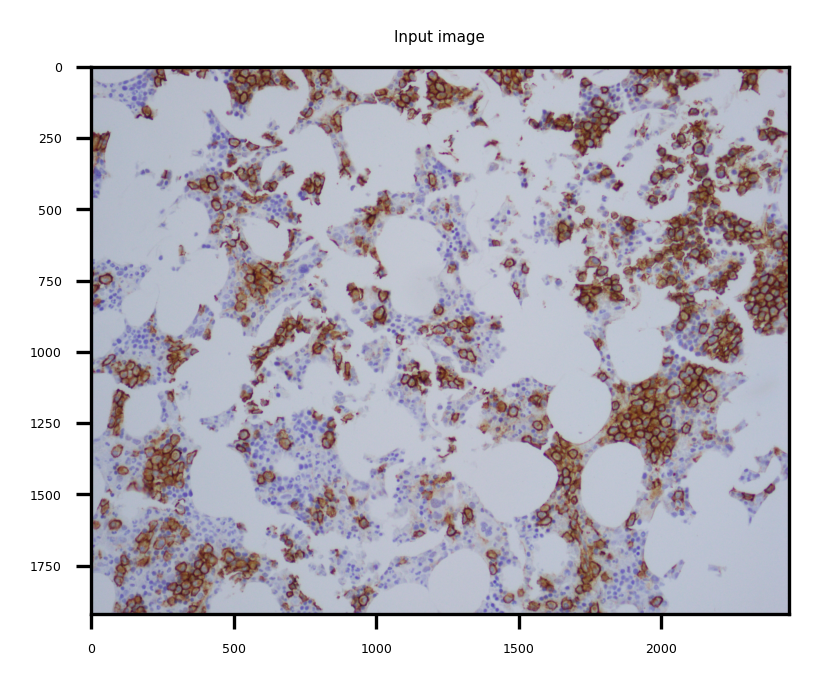

In [4]:
path = "/content/3.png"

image = cv2.imread(path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

print("size = ", np.shape(image))

# Ideal image size 
if np.shape(image) != (1920,2448,3):
    image = cv2.resize (image, (2448,1920), interpolation = cv2.INTER_AREA)
    print("WARNING: image resized to width/height ratio of 1.25")




matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize= (3,3))
plt.title("Input image")
plt.imshow(image)
plt.show()

#Automatic brightness and contrast optimization with optional histogram clipping
ideal alpha = 1 and ideal beta = 0

alpha 1.2085308056872037
beta 0.0


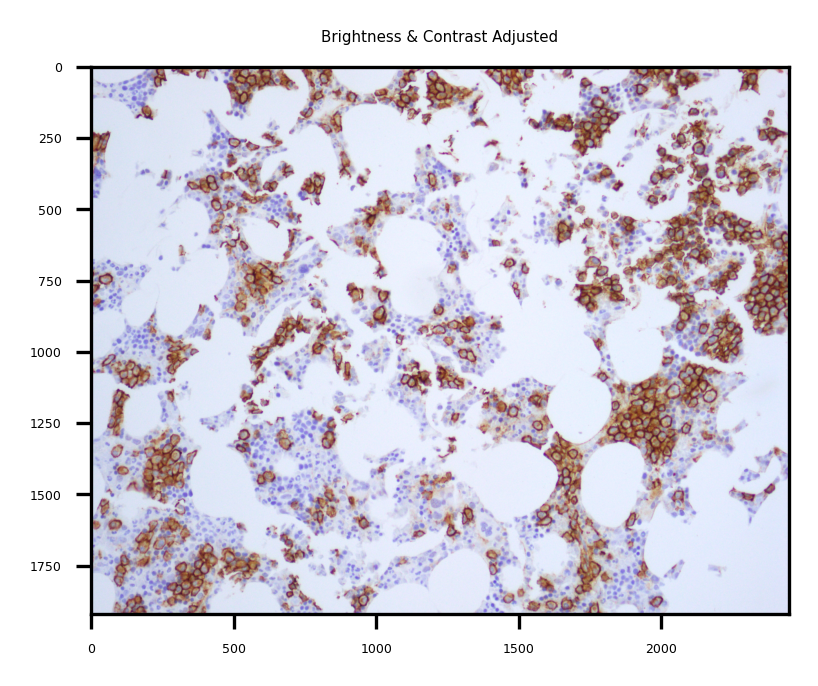

In [5]:
# https://stackoverflow.com/questions/56905592/automatic-contrast-and-brightness-adjustment-of-a-color-photo-of-a-sheet-of-pape/56909036
# Automatic brightness and contrast optimization with optional histogram clipping

def automatic_brightness_and_contrast(image, clip_hist_percent = 0):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Calculate grayscale histogram
    hist = cv2.calcHist([gray],[0],None,[256],[0,256])
    hist_size = len(hist)
    
    # Calculate cumulative distribution from the histogram
    accumulator = []
    accumulator.append(float(hist[0]))
    for index in range(1, hist_size):
        accumulator.append(accumulator[index -1] + float(hist[index]))
    
    # Locate points to clip
    maximum = accumulator[-1]
    clip_hist_percent *= (maximum/100.0)
    clip_hist_percent /= 2.0
    
    # Locate left cut
    minimum_gray = 0
    while accumulator[minimum_gray] < clip_hist_percent:
        minimum_gray += 1
    
    # Locate right cut
    maximum_gray = hist_size -1
    while accumulator[maximum_gray] >= (maximum - clip_hist_percent):
        maximum_gray -= 1
    
    # Calculate alpha and beta values
    alpha = 255 / (maximum_gray - minimum_gray)
    beta = -minimum_gray * alpha
    

    auto_result = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return (auto_result, alpha, beta)


image_auto_corrected, alpha, beta = automatic_brightness_and_contrast(image)
print('alpha', alpha)
print('beta', beta)

matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize=(3,3))
plt.title("Brightness & Contrast Adjusted")
plt.imshow(image_auto_corrected)
plt.show()


#Separate colors (IHC deconvolution)¶
https://scikit-image.org/docs/dev/auto_examples/color_exposure/plot_ihc_color_separation.html

https://github.com/scikit-image/scikit-image/issues/5164

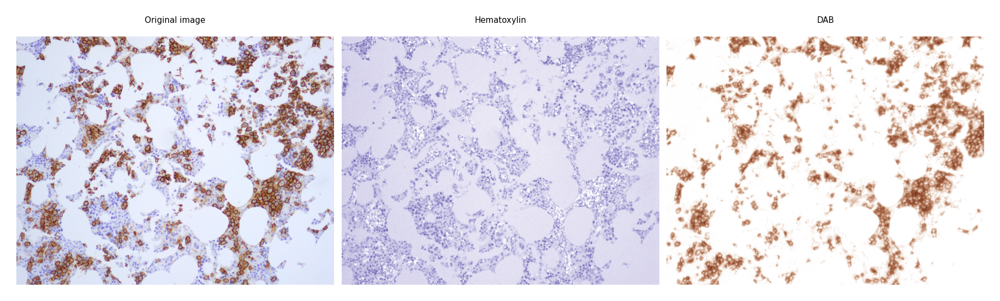

In [6]:
# Note that we have to convert to RGB b/c before this, I was making the conversion in the H&E normalization section, which I am not using here for DAB

# Separate the stains from the IHC image

ihc_hed = rgb2hed(image_auto_corrected)

# Create an RGB image for each of the stains
null = np.zeros_like(ihc_hed[:, :, 0])
ihc_h = hed2rgb(np.stack((ihc_hed[:, :, 0], null, null), axis=-1))
ihc_e = hed2rgb(np.stack((null, ihc_hed[:, :, 1], null), axis=-1))
ihc_d = hed2rgb(np.stack((null, null, ihc_hed[:, :, 2]), axis=-1))

# Display
fig, axes = plt.subplots(1,3, figsize=(6,6), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image_auto_corrected)
ax[0].set_title("Original image")

ax[1].imshow(ihc_h)
ax[1].set_title("Hematoxylin")

# ax[2].imshow(ihc_e)
# ax[2].set_title("Eosin") 

ax[2].imshow(ihc_d)
ax[2].set_title("DAB")

for a in ax.ravel():
    a.axis('off')

fig.tight_layout()

In [7]:
# Color deconvolution with Scikit image normalizes pixel values to [0-1]. Need to take it back to 255 range.
ihc_d_ = (ihc_d * 255).astype(np.uint8)
ihc_h_ = (ihc_h * 255).astype(np.uint8)
ihc_e_ = (ihc_e * 255).astype(np.uint8)
image_auto_corrected_ = image_auto_corrected.astype(np.uint8)

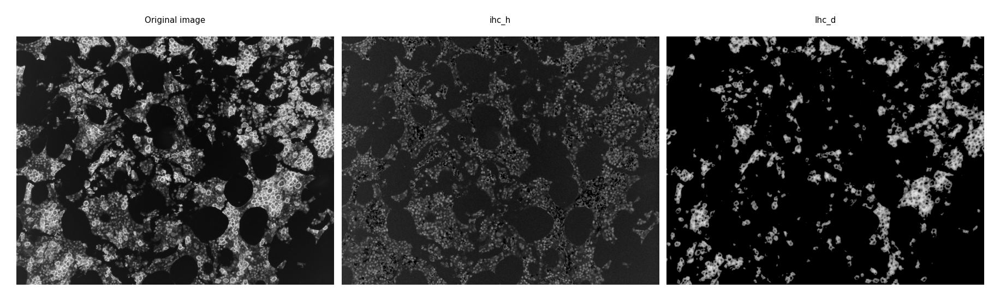

In [8]:
image_auto_corrected_gray = cv2.cvtColor(image_auto_corrected_, cv2.COLOR_RGB2GRAY)
image_auto_corrected_neg = 255 - image_auto_corrected_gray

ihc_h_gray = cv2.cvtColor(ihc_h_, cv2.COLOR_RGB2GRAY)
ihc_h_gray_neg = 255 - ihc_h_gray


ihc_d_gray = cv2.cvtColor(ihc_d_, cv2.COLOR_RGB2GRAY)
ihc_d_gray_neg = 255 - ihc_d_gray
ihc_d_gray_neg = np.where(ihc_d_gray_neg < 50, 0, ihc_d_gray_neg)


# Display
fig, axes = plt.subplots(1,3, figsize=(6,6), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image_auto_corrected_neg, cmap = 'gray')
ax[0].set_title("Original image")

ax[1].imshow(ihc_h_gray_neg, cmap = 'gray', vmin = 0, vmax = 255)
ax[1].set_title("ihc_h")

ax[2].imshow(ihc_d_gray_neg, cmap = 'gray')
ax[2].set_title("Ihc_d")

for a in ax.ravel():
    a.axis('off')

fig.tight_layout()


2022-04-21 02:16:39,174 [INFO] ** TORCH CUDA version installed and working. **
2022-04-21 02:16:39,176 [INFO] >>>> using GPU
2022-04-21 02:16:39,301 [INFO] ~~~ FINDING MASKS ~~~


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4004: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "


2022-04-21 02:16:42,650 [INFO] >>>> TOTAL TIME 3.35 sec
2022-04-21 02:16:42,728 [INFO] ** TORCH CUDA version installed and working. **
2022-04-21 02:16:42,737 [INFO] >>>> using GPU
2022-04-21 02:16:42,878 [INFO] ~~~ FINDING MASKS ~~~
2022-04-21 02:16:46,613 [INFO] >>>> TOTAL TIME 3.74 sec
2022-04-21 02:16:46,720 [INFO] ** TORCH CUDA version installed and working. **
2022-04-21 02:16:46,726 [INFO] >>>> using GPU
2022-04-21 02:16:46,853 [INFO] ~~~ FINDING MASKS ~~~
2022-04-21 02:16:51,351 [INFO] >>>> TOTAL TIME 4.50 sec
2022-04-21 02:16:51,434 [INFO] ** TORCH CUDA version installed and working. **
2022-04-21 02:16:51,435 [INFO] >>>> using GPU
2022-04-21 02:16:51,513 [INFO] ~~~ FINDING MASKS ~~~
2022-04-21 02:16:57,617 [INFO] >>>> TOTAL TIME 6.10 sec
2022-04-21 02:16:57,699 [INFO] ** TORCH CUDA version installed and working. **
2022-04-21 02:16:57,700 [INFO] >>>> using GPU
2022-04-21 02:16:57,772 [INFO] ~~~ FINDING MASKS ~~~
2022-04-21 02:17:06,426 [INFO] >>>> TOTAL TIME 8.65 sec
2022-04-

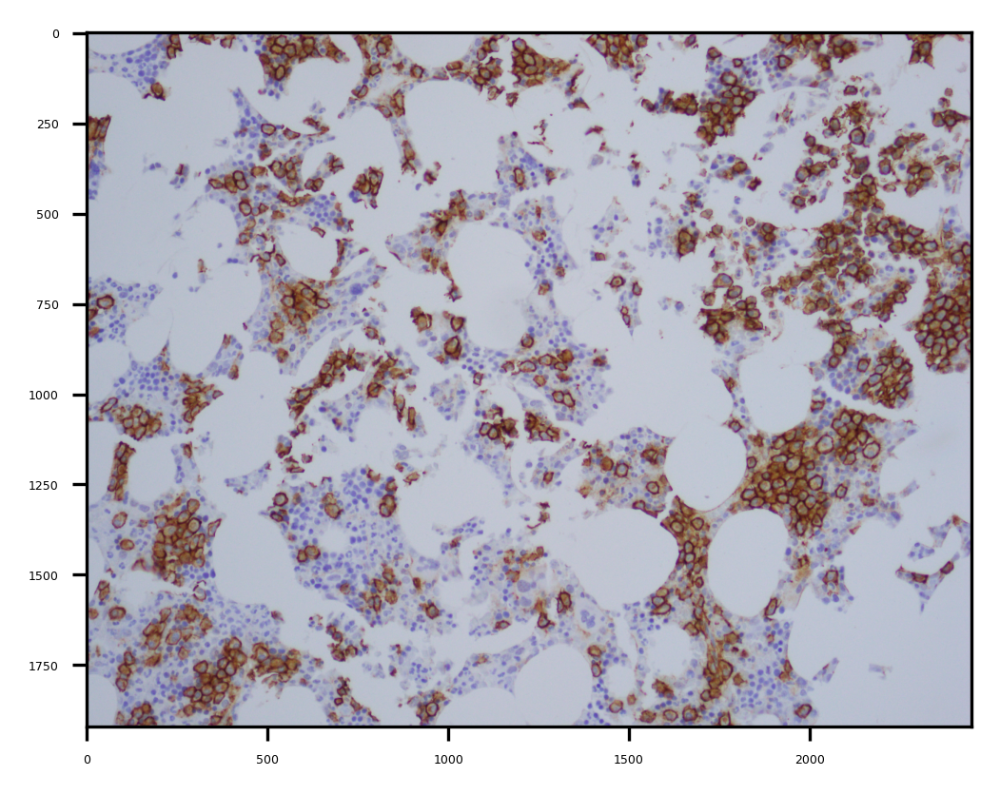

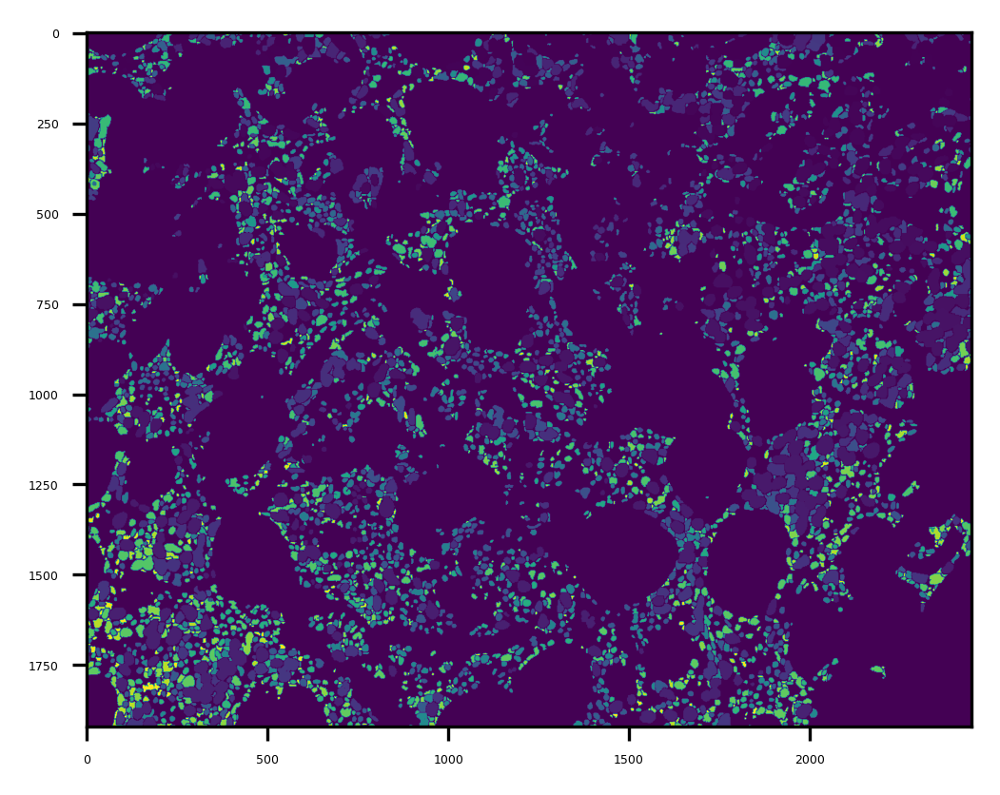

In [9]:
import time, os, sys
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300
from cellpose import utils, io
from cellpose import models, io
#!pip install cellpose

last_cell_count = 0
counter = 0


input_image = image_auto_corrected_neg

### 1. Run cellpose segmentation on the original image first ###
for i in range(40, 15, -5):
    # model_type='cyto' or model_type='nuclei'
    model = models.Cellpose(gpu= True, model_type='nuclei')
    channels = [0,0] # IF YOU HAVE GRAYSCALE
    masks, flows, styles, diams = model.eval(input_image, diameter = i, channels = channels)
    
    if i == 40:
        mask_final = masks
    else:
        masks_cell_lable_updated = np.where(masks > 0, masks + last_cell_count, 0)
        mask_final = np.where(mask_final==0, masks_cell_lable_updated, mask_final) 
        

    mask_temp = np.where(masks > 0, 1, 0)
    kernel = np.ones((5,5),np.uint8)
    mask_temp_dilated = cv2.dilate(mask_temp.astype(np.uint8), kernel, iterations = 1)


    mask_temp_dilated_flipped = np.where(mask_temp_dilated == 1, 0, -1) 
    mask_temp_dilated_flipped = np.where(mask_temp_dilated_flipped == -1, 1, mask_temp_dilated_flipped) 

    input_image = np.multiply(mask_temp_dilated_flipped, input_image)
    input_image = np.where(input_image < 50, 0, input_image)
    last_cell_count = np.max(mask_final)
    


# # Transition b/w original image to Hemotoxylin channel
mask_for_ihc_h = np.where(input_image > 0, 1, 0)    # Use the black and white image, with all the "zero holes", to create the new mask
input_image = np.multiply(mask_for_ihc_h, ihc_h_gray_neg)



### 2. Run cellpose segmentation on the Hemotoxylin channel with different cell size options  ###
for i in range(35, 15, -5):
    # model_type='cyto' or model_type='nuclei'
    model = models.Cellpose(gpu= True, model_type='nuclei')
    channels = [0,0] # IF YOU HAVE GRAYSCALE
    masks, flows, styles, diams = model.eval(input_image, diameter= i, channels = channels)


    masks_cell_lable_updated = np.where(masks > 0, masks + last_cell_count, 0)
    mask_final = np.where(mask_final==0, masks_cell_lable_updated, mask_final) 


    mask_temp = np.where(masks > 0, 1, 0)
    kernel = np.ones((5,5),np.uint8)
    mask_temp_dilated = cv2.dilate(mask_temp.astype(np.uint8), kernel, iterations = 1)
    mask_temp_dilated_flipped = np.where(mask_temp_dilated == 1, 0, -1) 
    mask_temp_dilated_flipped = np.where(mask_temp_dilated_flipped == -1, 1, mask_temp_dilated_flipped) 

    input_image = np.multiply(mask_temp_dilated_flipped, input_image)
    last_cell_count = np.max(mask_final)




# Visualizing the results
matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize= (4,4))
plt.imshow(image)
plt.show()

matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize= (4,4))
plt.imshow(mask_final)
plt.show()


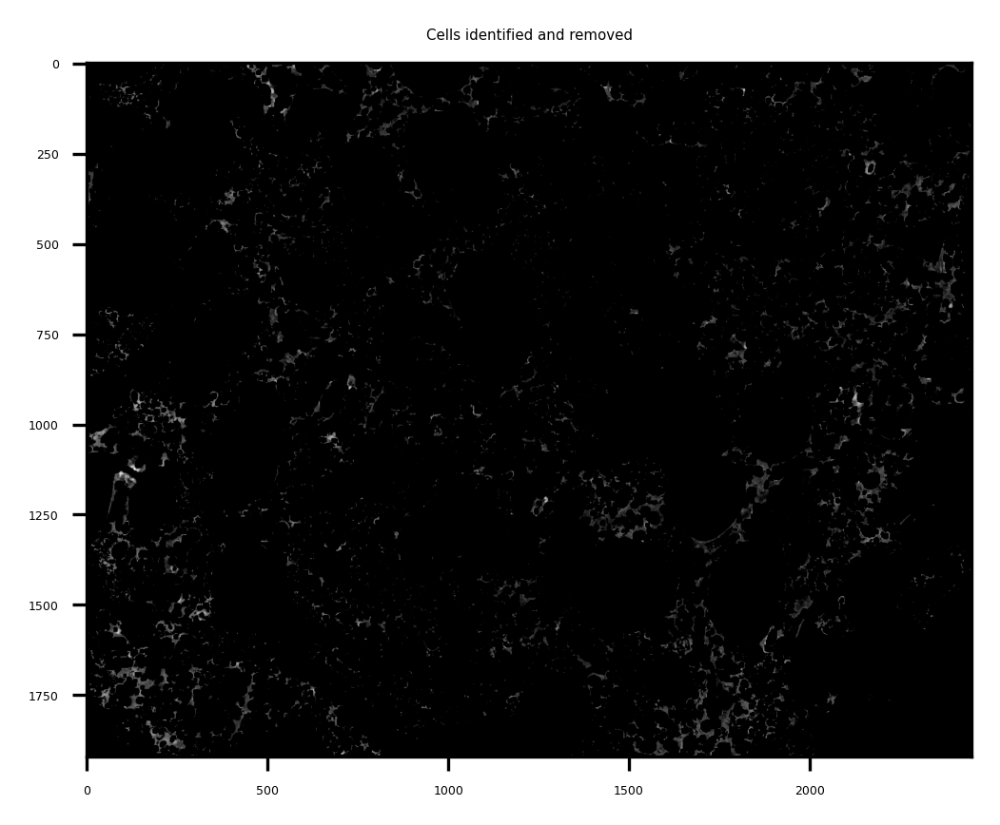

In [10]:
matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize=(4,4))
plt.title("Cells identified and removed")
plt.imshow(input_image, cmap = 'gray')
plt.show()

In [11]:
print("Number of total candidate cells identified: ", np.max(mask_final))

Number of total candidate cells identified:  4946


In [12]:
values, counts = np.unique(mask_final, return_counts=True)
len(values)

4947

In [13]:
uneroded_original_mask = np.copy(mask_final)

In [14]:
mask_final_cleared = clear_border(mask_final)

mask_final_cleared = np.where(mask_final_cleared > 0, 1, 0)
kernel = np.ones((5,5),np.uint8)
mask_final_cleared_eroded = cv2.erode(mask_final_cleared.astype(np.uint8), kernel, iterations = 0)

mask_final = mask_final * mask_final_cleared_eroded

In [15]:
values, counts = np.unique(mask_final, return_counts=True)
len(values)

4804

# Using Scikit image Region Props to extrach morphological features of objects identified

In [16]:
# A function/method that will create some morphological measurements on the mask generated by cellpose

def predict_generate_cell_properties(input_cell_mask, input_image):    
    # Label each region/cell 
    masks = skimage.measure.label(input_cell_mask, background= 0, return_num= False, connectivity = 2)

    # Get properties of each region/cell
    cell_props = regionprops_table((masks), input_image, properties= ['label','area','bbox', 'centroid', 'minor_axis_length', 'major_axis_length', 'mean_intensity'])
    df = pd.DataFrame(cell_props)
    df.tail()

    return df


# Creating a nucleus datafram for visualization of nuclear segmentation results

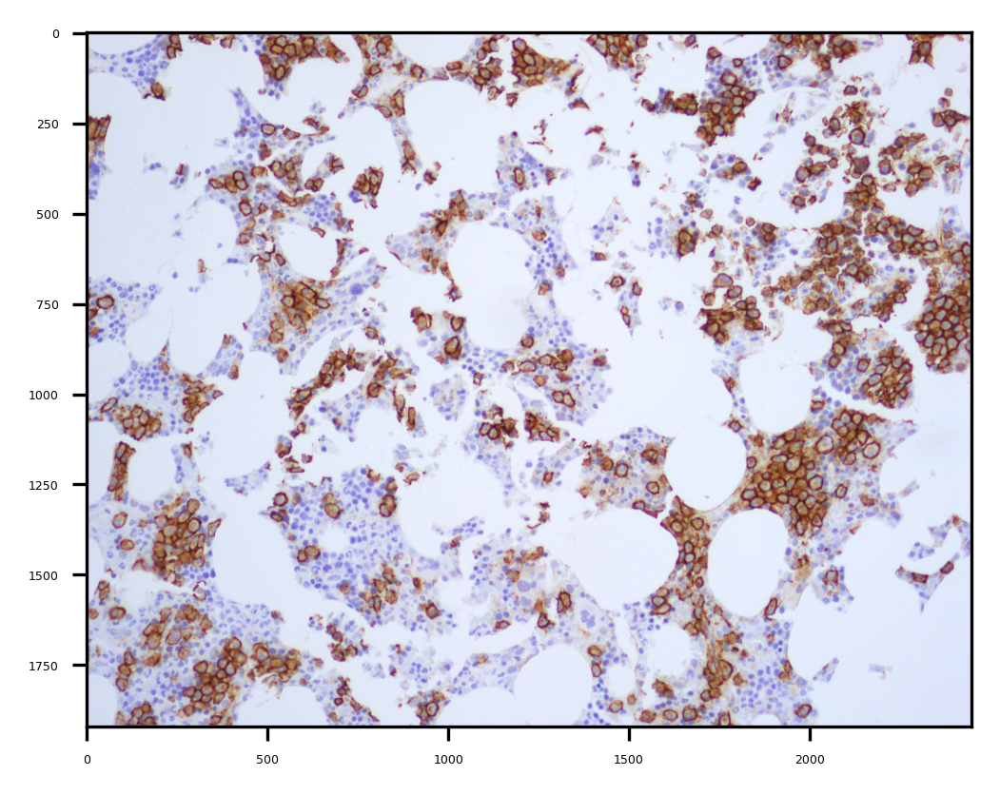

In [17]:
df_nuclei = predict_generate_cell_properties(mask_final, image_auto_corrected)
original_image_copy_total_cells = np.copy(image_auto_corrected)


matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize= (4,4))
plt.imshow(original_image_copy_total_cells)
plt.show()


In [18]:
df_nuclei

,label,area,bbox-0,bbox-1,bbox-2,bbox-3,centroid-0,centroid-1,minor_axis_length,major_axis_length,mean_intensity-0,mean_intensity-1,mean_intensity-2
0,1,397,2,1123,23,1155,10.881612,1138.314861,17.874550,29.928880,166.929471,121.753149,137.758186
1,2,47,3,384,9,396,6.085106,389.382979,5.790799,11.789093,201.531915,186.234043,172.787234
2,3,47,4,452,13,459,8.574468,455.404255,6.827135,9.074487,157.042553,145.127660,208.148936
3,4,45,4,1157,13,1163,8.133333,1159.022222,5.780661,10.122717,207.755556,184.622222,180.711111
4,5,952,5,1521,43,1552,23.635504,1536.093487,32.155068,38.100546,145.941176,91.380252,100.425420
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4815,4816,193,1901,1375,1917,1391,1908.253886,1382.839378,14.625041,17.030324,158.549223,150.269430,226.777202
4816,4817,53,1901,1400,1910,1412,1904.283019,1405.471698,7.615446,11.858967,193.584906,199.452830,238.716981
4817,4818,51,1906,407,1916,414,1909.705882,409.274510,6.322291,11.332222,193.882353,204.980392,214.137255
4818,4819,132,1907,1664,1916,1681,1910.477273,1671.795455,9.455791,18.405402,138.318182,129.378788,177.492424


In [19]:
np.mean(df_nuclei['minor_axis_length'])

12.872342679826415

In [20]:
from skimage.segmentation import watershed, expand_labels

# create the circumference mask by including the cell wall (eroded mask) + periphery of each cell
# Cytoplasmic ring = Expanded nuclear mask - eroded nuclear mask
# in order to include part of the nuclear mask in the cytoplasmic ring, expand/dilate the rim mask one more time (both inward and outward directions)

# Thickness of cytplasmic rim around the nucleus is estimated at roughly half of the cell radius
cytoplasm_thickness = int(np.mean(df_nuclei['minor_axis_length']) /2)
nuclei_rim_mask_ = expand_labels(mask_final, distance= cytoplasm_thickness) - mask_final 
nuclei_rim_mask = expand_labels(nuclei_rim_mask_, distance= 7)

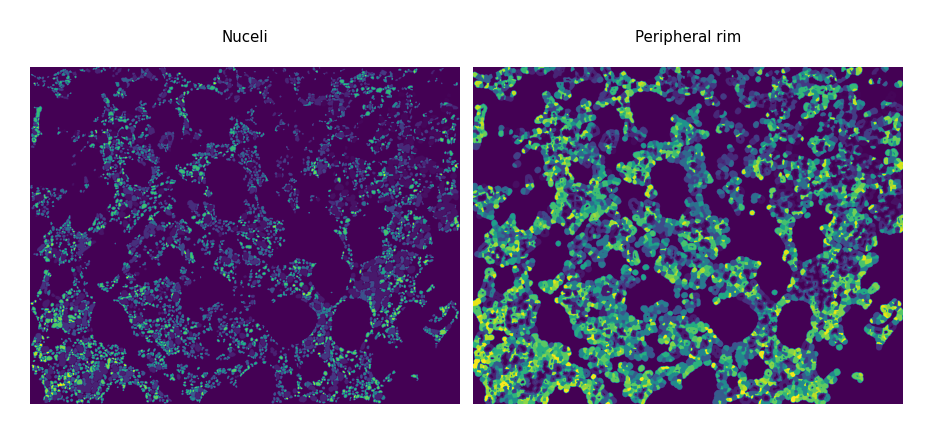

In [21]:
# Display
matplotlib.rcParams.update({'font.size': 3})

fig, axes = plt.subplots(1,2, figsize=(3,3), sharex = True, sharey = True)
ax = axes.ravel()

ax[0].imshow(mask_final)
ax[0].set_title("Nuceli")
ax[1].imshow(nuclei_rim_mask)
ax[1].set_title("Peripheral rim")

for a in ax.ravel():
    a.axis('off')

fig.tight_layout()

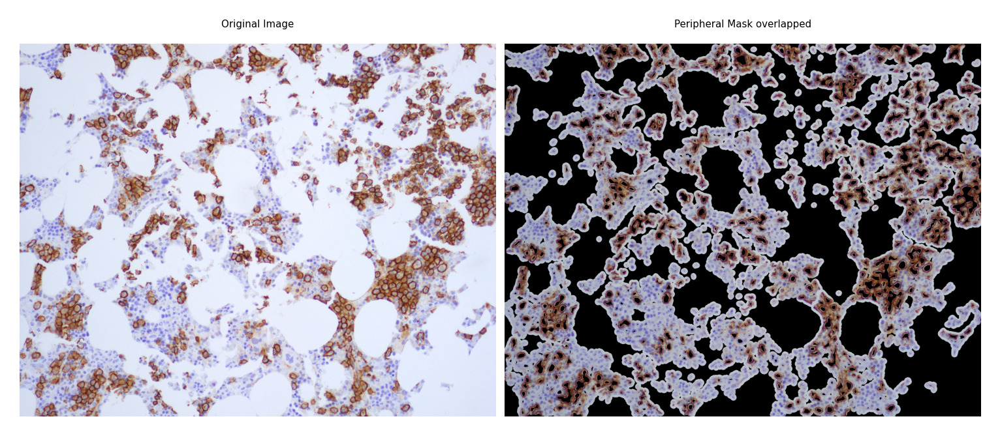

In [22]:
# Visualing borders on the original image for inspection only:

binary_nuclei_rim_mask = np.where(nuclei_rim_mask == 0, 0, 1)

B,G,R = cv2.split(image)

B = np.multiply(B, binary_nuclei_rim_mask)
G = np.multiply(G, binary_nuclei_rim_mask)
R = np.multiply(R, binary_nuclei_rim_mask)

border_image_mask = cv2.merge([B,G,R])


# Display
matplotlib.rcParams.update({'font.size': 3})

fig, axes = plt.subplots(1,2, figsize=(5,5), sharex = True, sharey = True)
ax = axes.ravel()
ax[0].imshow(image_auto_corrected)
ax[0].set_title("Original Image")
ax[1].imshow(border_image_mask)
ax[1].set_title("Peripheral Mask overlapped")

for a in ax.ravel():
    a.axis('off')

fig.tight_layout()

# Just visualizing individual cell masks for inspection

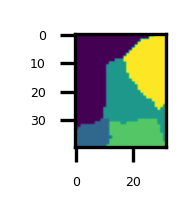

In [23]:
i = 101

cytoplasm_thickness_ = int(np.mean(df_nuclei['minor_axis_length']))

matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize=(0.5, 0.5))
plt.imshow(nuclei_rim_mask[df_nuclei['bbox-0'][i] - cytoplasm_thickness_ : df_nuclei['bbox-2'][i] + cytoplasm_thickness_, df_nuclei['bbox-1'][i] - cytoplasm_thickness_ : df_nuclei['bbox-3'][i] + cytoplasm_thickness_])
plt.show()

In [24]:
# np.set_printoptions(edgeitems=500, linewidth=1500, 
#     formatter=dict(float=lambda x: "%.3g" % x))

# print(nuclei_rim_mask[df_nuclei['bbox-0'][i] - cytoplasm_thickness_ : df_nuclei['bbox-2'][i] + cytoplasm_thickness_, df_nuclei['bbox-1'][i] - cytoplasm_thickness_ : df_nuclei['bbox-3'][i] + cytoplasm_thickness_])

In [25]:
from keras.models import load_model

model_CD138_counter = load_model('/content/drive/MyDrive/Colab Notebooks/saved_models/CD138_Binary_classification_40x40_April_15th.h5', compile = False)

In [26]:
# Estimating mean cytoplasmic thickness using cell radius
cytoplasm_thickness = int(np.mean(df_nuclei['minor_axis_length']))

In [27]:
#!pip install scikit-image==0.18.3
from skimage.color import rgb2hed, hed2rgb

def Deconvolve_DAB(img):
    # Separate the stains from the IHC image
    ihc_hed = rgb2hed(img)

    # Create an RGB image for each of the stains
    null = np.zeros_like(ihc_hed[:, :, 0])
    ihc_h = hed2rgb(np.stack((ihc_hed[:, :, 0], null, null), axis=-1))
    ihc_e = hed2rgb(np.stack((null, ihc_hed[:, :, 1], null), axis=-1))
    ihc_d = hed2rgb(np.stack((null, null, ihc_hed[:, :, 2]), axis=-1))
    
    #return img
    return (ihc_d * 255).astype(np.uint8)


100%|██████████| 4820/4820 [02:12<00:00, 36.29it/s]


CD138+ count =  531
Total cell count = 3222


Staining percentage = 16.48%




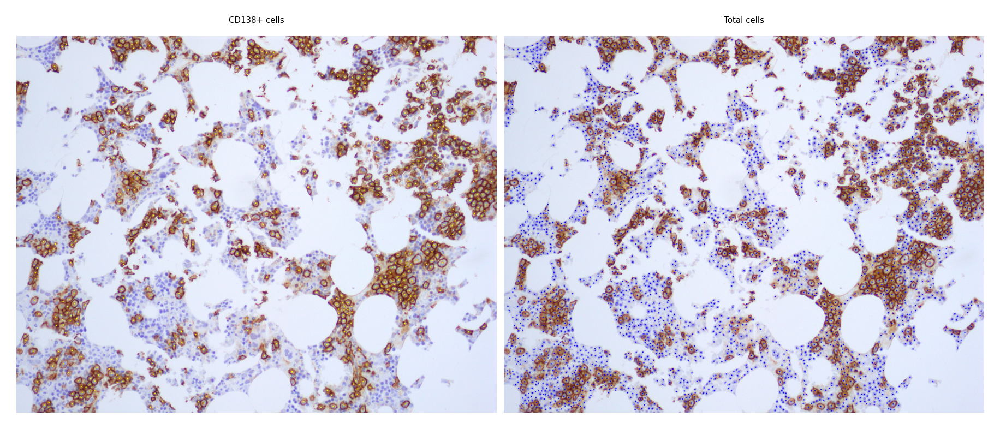

In [28]:
CD138_counter = 0
Tota_cell_counter = 0
DAB_index_values = []
Partial_circle_DAB_array = []
False_nuclear_staining_level_array = []
proposed_stain_threshold  = 0.25
CNN_ideal_threshold = 0.005


original_image_copy_CD138_ver2 = np.copy(image_auto_corrected)
original_image_copy_Total_Cells_ver2 = np.copy(image_auto_corrected)
border_image_mask_copy_CD138_ver2 = np.copy(border_image_mask)

c = 0
for i in tqdm(range(len(df_nuclei))):
    if df_nuclei['area'][i] > 100:   # Exclude cells smaller than ~10 pixel in diameter

        # Image crop
        cytoplasm_thickness = 5
        image_crop_ = image_auto_corrected [df_nuclei['bbox-0'][i] - cytoplasm_thickness : df_nuclei['bbox-2'][i] + cytoplasm_thickness, df_nuclei['bbox-1'][i] - cytoplasm_thickness : df_nuclei['bbox-3'][i] + cytoplasm_thickness]
        h, w, d = np.shape(image_crop_)

        if h > 10 and w > 10:
            c+=1
            # model expect 40x40 RGB (specifically, DAB channel only)
            ihc_d_crop = Deconvolve_DAB(image_crop_)
            ihc_d_crop_40x40 = cv2.resize(ihc_d_crop, (40,40),interpolation=cv2.INTER_AREA)
            ihc_d_crop_40x40_ = np.expand_dims(ihc_d_crop_40x40, axis = 0)

            if model_CD138_counter.predict(ihc_d_crop_40x40_) > CNN_ideal_threshold:

                CD138_counter += 1   
                cv2.circle(original_image_copy_CD138_ver2,(df_nuclei.loc[i, ['centroid-1']], df_nuclei.loc[i, ['centroid-0']]), 3, (255,255,0), -1)
                cv2.circle(border_image_mask_copy_CD138_ver2,(df_nuclei.loc[i, ['centroid-1']], df_nuclei.loc[i, ['centroid-0']]), 3, (255,255,0), -1)

            # Total cell image
            Tota_cell_counter += 1
            cv2.circle(original_image_copy_Total_Cells_ver2,(df_nuclei.loc[i, ['centroid-1']], df_nuclei.loc[i, ['centroid-0']]), 3, (0,0,255), -1)


# # Save a local copy of the results
# from PIL import Image
# im = Image.fromarray(original_image_copy_CD138_ver2)
# im.save('/content/CD138_{}.jpeg'.format(ntpath.basename(path)))         

# im = Image.fromarray(original_image_copy_Total_Cells_ver2)
# im.save('/content/Total_{}.jpeg'.format(ntpath.basename(path)))         


print("CD138+ count = ", CD138_counter)
print("Total cell count =", Tota_cell_counter)
print("\n")
print("Staining percentage = {}%".format(np.round(100 * (CD138_counter / Tota_cell_counter), decimals = 2)))
print("\n")


# Display
fig, axes = plt.subplots(1,2, figsize=(6,6), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(original_image_copy_CD138_ver2)
ax[0].set_title("CD138+ cells")

ax[1].imshow(original_image_copy_Total_Cells_ver2)
ax[1].set_title("Total cells")

# ax[2].imshow(border_image_mask_copy_CD138_ver2)
# ax[2].set_title("Visualizing cell membranes")

for a in ax.ravel():
    a.axis('off')

fig.tight_layout()
